# 

Rainfall Prediction - Weather Forecasting
Problem Statement:
Rain Prediction –Weather forecasting

Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.

Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:
 
1. Problem Statement: 
a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.

b)  Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.


Dataset Description:

Number of columns: 23


Date  - The date of observation

Location  -The common name of the location of the weather station

MinTemp  -The minimum temperature in degrees celsius

MaxTemp -The maximum temperature in degrees celsius

Rainfall  -The amount of rainfall recorded for the day in mm

Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am

Sunshine  -The number of hours of bright sunshine in the day.

WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight

WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight

WindDir9am -Direction of the wind at 9am

WindDir3pm -Direction of the wind at 3pm

WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am

WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm

Humidity9am -Humidity (percent) at 9am

Humidity3pm -Humidity (percent) at 3pm

Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am

Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm

Cloud9am - Fraction of sky obscured by cloud at 9am. 

Cloud3pm -Fraction of sky obscured by cloud 

Temp9am-Temperature (degrees C) at 9am

Temp3pm -Temperature (degrees C) at 3pm

RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0

RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".

In [2]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
import sklearn
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
import warnings
warnings.filterwarnings('ignore')
from matplotlib import style
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import Perceptron
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.naive_bayes import GaussianNB
from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import power_transform
from scipy.stats import zscore
from sklearn.metrics import plot_roc_curve 

In [3]:
df=pd.read_csv("https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv")

In [4]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [5]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

# 
These are the categorical columns in the given dataset

In [6]:
df.shape

(8425, 23)

# 
Dataset having 8425 rows and 23 columns

In [7]:
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

# 
The dataset contains object and float type data

In [8]:
df.nunique()

Date             3004
Location           12
MinTemp           285
MaxTemp           331
Rainfall          250
Evaporation       116
Sunshine          140
WindGustDir        16
WindGustSpeed      52
WindDir9am         16
WindDir3pm         16
WindSpeed9am       34
WindSpeed3pm       35
Humidity9am        90
Humidity3pm        94
Pressure9am       384
Pressure3pm       374
Cloud9am            9
Cloud3pm            9
Temp9am           304
Temp3pm           328
RainToday           2
RainTomorrow        2
dtype: int64

# 
These are the unique values present in each column

In [9]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

# 
Missing values present in MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow.Will fill them using imputation techniques.

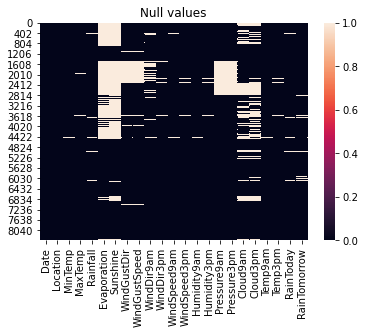

In [10]:
sns.heatmap(df.isnull())
plt.title("Null values")
plt.show()

# 
The white lines in the heat map representd the missing values in the data

In [11]:
df["MinTemp"] = df["MinTemp"].fillna(df["MinTemp"].mode()[0])


df["MaxTemp"] = df["MaxTemp"].fillna(df["MaxTemp"].mode()[0])


df["Rainfall"] = df["Rainfall"].fillna(df["Rainfall"].mode()[0])


df["Evaporation"] = df["Evaporation"].fillna(df["Evaporation"].mode()[0])


df["Sunshine"] = df["Sunshine"].fillna(df["Sunshine"].mode()[0])


df["WindGustDir"] = df["WindGustDir"].fillna(df["WindGustDir"].mode()[0])


df["WindGustSpeed"] = df["WindGustSpeed"].fillna(df["WindGustSpeed"].mode()[0])


df["WindDir9am"] = df["WindDir9am"].fillna(df["WindDir9am"].mode()[0])


df["WindDir3pm"] = df["WindDir3pm"].fillna(df["WindDir3pm"].mode()[0])


df["WindSpeed9am"] = df["WindSpeed9am"].fillna(df["WindSpeed9am"].mode()[0])


df["WindSpeed3pm"] = df["WindSpeed3pm"].fillna(df["WindSpeed3pm"].mode()[0])


df["Humidity9am"] = df["Humidity9am"].fillna(df["Humidity9am"].mode()[0])


df["Humidity3pm"] = df["Humidity3pm"].fillna(df["Humidity3pm"].mode()[0])


df["Pressure9am"] = df["Pressure9am"].fillna(df["Pressure9am"].mode()[0])


df["Pressure3pm"] = df["Pressure3pm"].fillna(df["Pressure3pm"].mode()[0])


df["Cloud9am"] = df["Cloud9am"].fillna(df["Cloud9am"].mode()[0])


df["Cloud3pm"] = df["Cloud3pm"].fillna(df["Cloud3pm"].mode()[0])


df["Temp9am"] = df["Temp9am"].fillna(df["Temp9am"].mode()[0])


df["Temp3pm"] = df["Temp3pm"].fillna(df["Temp3pm"].mode()[0])


df["RainToday"] = df["RainToday"].fillna(df["RainToday"].mode()[0])


df["RainTomorrow"] = df["RainTomorrow"].fillna(df["RainTomorrow"].mode()[0])

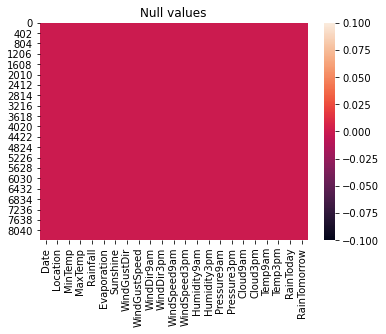

In [12]:
sns.heatmap(df.isnull())
plt.title("Null values")
plt.show()

In [13]:
df['Date'] = pd.to_datetime(arg=df['Date'])

In [14]:
df["Month"] = df["Date"].dt.month
df["Year"] = df["Date"].dt.year
df["Day"] = df["Date"].dt.day

Text(0, 0.5, 'Pressure at 3pm')

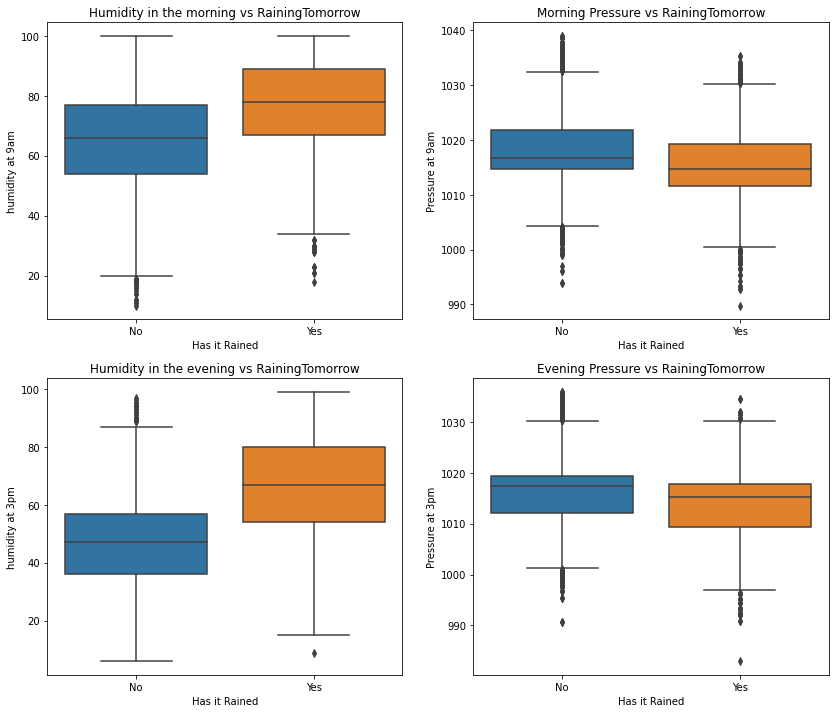

In [15]:
plt.figure(1,figsize=[14,12])


plt.subplot(2,2,1)
sns.boxplot(data=df,y="Humidity9am",x="RainTomorrow")
plt.title("Humidity in the morning vs RainingTomorrow")
plt.xlabel("Has it Rained")
plt.ylabel("humidity at 9am")


plt.subplot(2,2,2)
sns.boxplot(data=df,y="Pressure9am",x="RainTomorrow")
plt.title("Morning Pressure vs RainingTomorrow")
plt.xlabel("Has it Rained")
plt.ylabel("Pressure at 9am")


plt.subplot(2,2,3)
sns.boxplot(data=df,y="Humidity3pm",x="RainTomorrow")
plt.title("Humidity in the evening vs RainingTomorrow")
plt.xlabel("Has it Rained")
plt.ylabel("humidity at 3pm")


plt.subplot(2,2,4)
sns.boxplot(data=df,y="Pressure3pm",x="RainTomorrow")
plt.title("Evening Pressure vs RainingTomorrow")
plt.xlabel("Has it Rained")
plt.ylabel("Pressure at 3pm")

Text(0, 0.5, 'Evening Humidity')

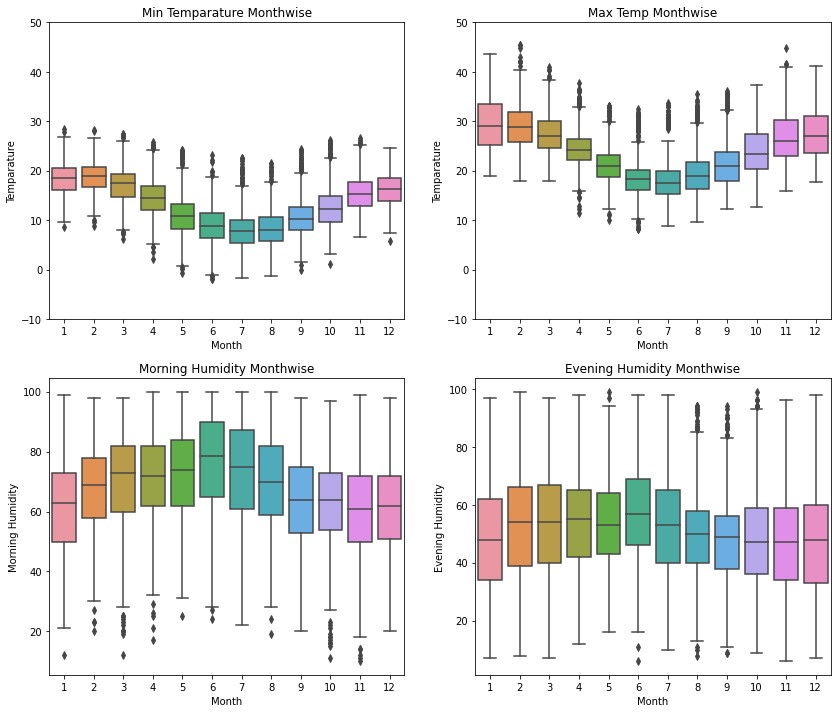

In [16]:

plt.figure(1,figsize=[14,12])


plt.subplot(2,2,1)
sns.boxplot(data=df,y="MinTemp",x="Month")
plt.title("Min Temparature Monthwise")
plt.xlabel("Month")
plt.ylabel("Temparature")
plt.ylim([-10,50])


plt.subplot(2,2,2)
sns.boxplot(data=df,y="MaxTemp",x="Month")
plt.title("Max Temp Monthwise")
plt.xlabel("Month")
plt.ylabel("Temparature")
plt.ylim([-10,50])


plt.subplot(2,2,3)
sns.boxplot(data=df,y="Humidity9am",x="Month")
plt.title("Morning Humidity Monthwise")
plt.xlabel("Month")
plt.ylabel("Morning Humidity")


plt.subplot(2,2,4)
sns.boxplot(data=df,y="Humidity3pm",x="Month")
plt.title("Evening Humidity Monthwise")
plt.xlabel("Month")
plt.ylabel("Evening Humidity")

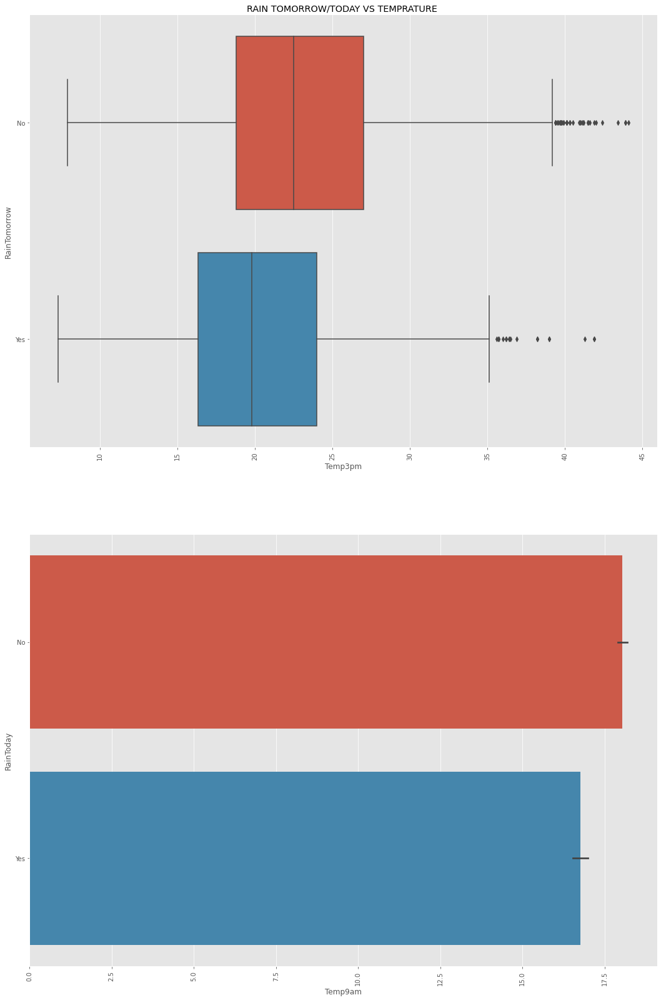

In [17]:
plt.style.use('ggplot')

fig = plt.figure(figsize=(18, 28))
ax = plt.subplot(2,1,1)
ax = plt.xticks(rotation=90)
ax = sns.boxplot(x='Temp3pm', y='RainTomorrow', data=df)
ax = plt.title('RAIN TOMORROW/TODAY VS TEMPRATURE ')

ax = plt.subplot(2,1,2)
ax = plt.xticks(rotation=90)
ax = sns.barplot(x='Temp9am', y='RainToday', data=df)

<AxesSubplot:>

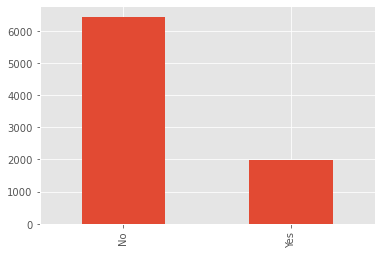

In [18]:
df['RainTomorrow'].value_counts().plot(kind='bar')

# 
Looks like the Target variable is imbalanced. It has more ‘No’ values. If data is imbalanced, then it might decrease the performance of the model. As this data is released by the meteorological department of Australia, it doesn’t make any sense when we try to balance the target variable, because the truthfulness of data might decrease. So, let me keep it as it is.

<AxesSubplot:xlabel='Sunshine', ylabel='Rainfall'>

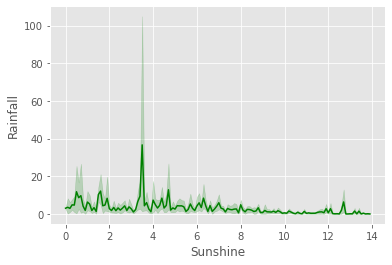

In [19]:
sns.lineplot(data=df,x='Sunshine',y='Rainfall',color='green')

<AxesSubplot:xlabel='Sunshine', ylabel='Evaporation'>

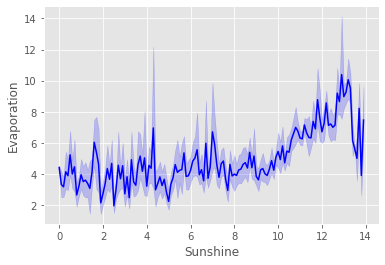

In [20]:
sns.lineplot(data=df,x='Sunshine',y='Evaporation',color='blue')

# 
In the above line plot, the Sunshine feature is proportional to the Evaporation feature.

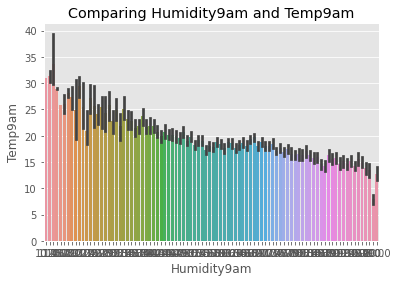

In [21]:
sns.barplot(x="Humidity9am",y="Temp9am",data=df)
plt.title("Comparing Humidity9am and Temp9am")
plt.show()

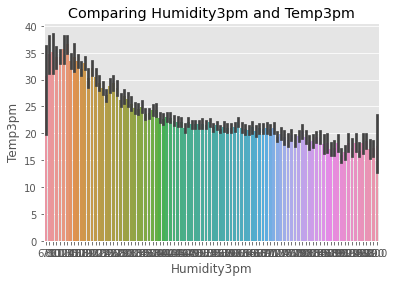

In [22]:
sns.barplot(x="Humidity3pm",y="Temp3pm",data=df)
plt.title("Comparing Humidity3pm and Temp3pm")
plt.show()

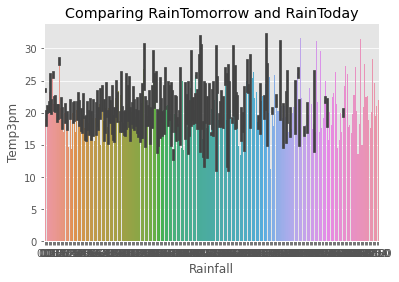

In [23]:
sns.barplot(x="Rainfall",y="Temp3pm",data=df)
plt.title("Comparing RainTomorrow and RainToday")
plt.show()

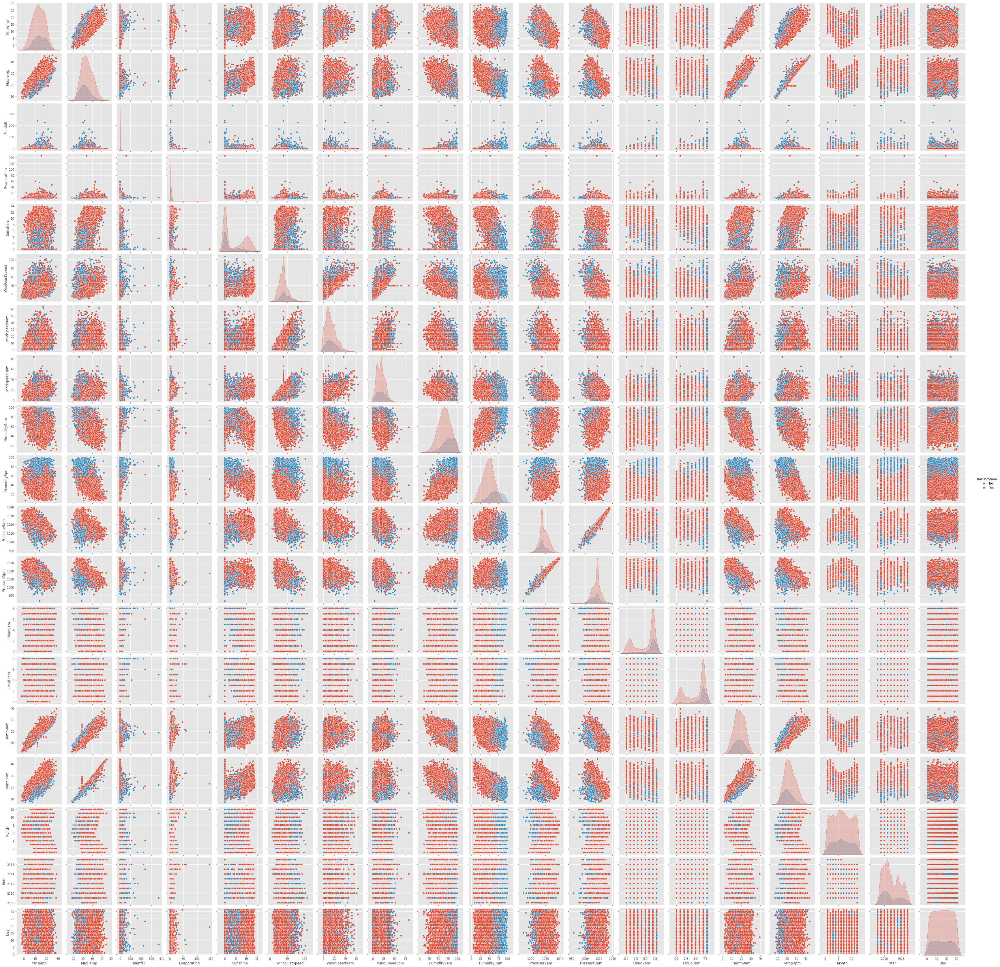

In [24]:
sns.pairplot(df,hue="RainTomorrow")

In [25]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Month,Year,Day
count,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000
mean,13.182682,23.825365,2.725982,4.810220,4.014042,40.036320,13.803917,18.412582,67.858754,51.295193,1017.198944,1015.635347,5.265875,5.230742,17.742326,22.405982,6.442136,2012.102433,15.741958
std,5.380656,6.128159,10.319872,3.912448,4.744297,13.781296,10.138945,9.763307,16.779787,18.316487,6.359552,6.286580,2.667166,2.564122,5.613463,5.955804,3.437994,2.473137,8.787354
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000,1.000000,2008.000000,1.000000
25%,9.300000,19.200000,0.000000,4.000000,0.000000,31.000000,6.000000,11.000000,56.000000,39.000000,1014.000000,1011.400000,3.000000,3.000000,13.800000,18.100000,3.000000,2010.000000,8.000000
50%,13.200000,23.200000,0.000000,4.000000,0.200000,39.000000,13.000000,19.000000,68.000000,51.000000,1016.100000,1017.000000,7.000000,7.000000,17.700000,21.800000,6.000000,2011.000000,16.000000
75%,17.300000,28.000000,0.800000,5.200000,8.900000,48.000000,20.000000,24.000000,80.000000,63.000000,1021.300000,1018.800000,7.000000,7.000000,21.900000,26.300000,9.000000,2014.000000,23.000000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000,12.000000,2017.000000,31.000000


In [26]:
df = df.apply(LabelEncoder().fit_transform)
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month,Year,Day
0,0,1,149,134,5,21,0,13,20,13,...,103,8,7,145,134,0,0,11,0,0
1,1,1,89,156,0,21,0,14,20,6,...,110,7,7,148,159,0,0,11,0,1
2,2,1,144,162,0,21,0,15,21,13,...,119,7,2,186,148,0,0,11,0,2
3,3,1,107,185,0,21,0,4,9,9,...,160,7,7,157,181,0,0,11,0,3
4,4,1,190,228,8,21,0,13,18,1,...,92,7,8,154,213,0,0,11,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2999,9,43,139,0,21,0,0,13,9,...,235,7,7,77,140,0,0,5,9,20
8421,3000,9,51,158,0,21,0,6,8,9,...,223,7,7,85,161,0,0,5,9,21
8422,3001,9,69,174,0,21,0,3,16,9,...,200,7,7,101,177,0,0,5,9,22
8423,3002,9,93,175,0,21,0,9,11,10,...,197,3,2,127,176,0,0,5,9,23


In [27]:
print(df.corr())

                   Date  Location   MinTemp   MaxTemp  Rainfall  Evaporation  \
Date           1.000000  0.475037  0.016092  0.099635  0.003544     0.107323   
Location       0.475037  1.000000  0.116337  0.063390  0.013764     0.129145   
MinTemp        0.016092  0.116337  1.000000  0.717046  0.100715     0.360600   
MaxTemp        0.099635  0.063390  0.717046  1.000000 -0.137805     0.438922   
Rainfall       0.003544  0.013764  0.100715 -0.137805  1.000000    -0.054765   
Evaporation    0.107323  0.129145  0.360600  0.438922 -0.054765     1.000000   
Sunshine      -0.261606 -0.093480  0.136761  0.291228 -0.119029     0.297657   
WindGustDir   -0.084552 -0.035408 -0.144028 -0.219795  0.076678    -0.089647   
WindGustSpeed -0.045105  0.230493  0.230635  0.139601  0.095885     0.212101   
WindDir9am    -0.012369 -0.027103 -0.040255 -0.211361  0.129276    -0.065018   
WindDir3pm    -0.002895 -0.027736 -0.147692 -0.181763  0.066275    -0.046861   
WindSpeed9am  -0.087578  0.220281  0.136

<function matplotlib.pyplot.show(close=None, block=None)>

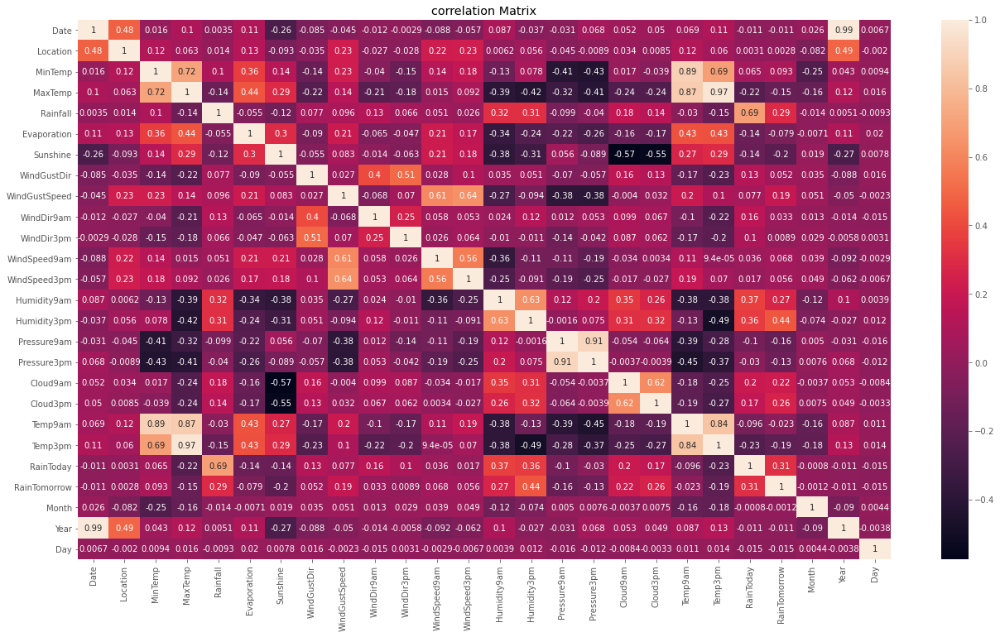

In [28]:
corr_mat=df.corr()

plt.figure(figsize=[22,12])
sns.heatmap(corr_mat,annot=True)
plt.title("correlation Matrix")
plt.show

In [29]:
corr_matrix=df.corr()
corr_matrix['RainTomorrow'].sort_values(ascending=False)

RainTomorrow     1.000000
Humidity3pm      0.444347
RainToday        0.312929
Rainfall         0.292586
Humidity9am      0.271411
Cloud3pm         0.261159
Cloud9am         0.216294
WindGustSpeed    0.190388
MinTemp          0.092759
WindSpeed9am     0.067818
WindSpeed3pm     0.056227
WindGustDir      0.051832
WindDir9am       0.032860
WindDir3pm       0.008918
Location         0.002824
Month           -0.001243
Year            -0.011066
Date            -0.011228
Day             -0.015461
Temp9am         -0.023481
Evaporation     -0.078838
Pressure3pm     -0.131129
MaxTemp         -0.150772
Pressure9am     -0.161063
Temp3pm         -0.192618
Sunshine        -0.197937
Name: RainTomorrow, dtype: float64

In [30]:
corr_matrix=df.corr()
corr_matrix['Rainfall'].sort_values(ascending=False)

Rainfall         1.000000
RainToday        0.692221
Humidity9am      0.315022
Humidity3pm      0.313108
RainTomorrow     0.292586
Cloud9am         0.179619
Cloud3pm         0.139258
WindDir9am       0.129276
MinTemp          0.100715
WindGustSpeed    0.095885
WindGustDir      0.076678
WindDir3pm       0.066275
WindSpeed9am     0.050967
WindSpeed3pm     0.026434
Location         0.013764
Year             0.005102
Date             0.003544
Day             -0.009349
Month           -0.013692
Temp9am         -0.029713
Pressure3pm     -0.039567
Evaporation     -0.054765
Pressure9am     -0.098910
Sunshine        -0.119029
MaxTemp         -0.137805
Temp3pm         -0.145332
Name: Rainfall, dtype: float64

In [31]:
x=df.drop('RainTomorrow', axis=1)
y=df['RainTomorrow']

In [32]:
x.skew()

Date             0.386560
Location        -0.050456
MinTemp         -0.087856
MaxTemp          0.373751
Rainfall         3.553135
Evaporation      2.363860
Sunshine         0.606448
WindGustDir      0.119640
WindGustSpeed    0.777106
WindDir9am       0.172792
WindDir3pm      -0.119847
WindSpeed9am     0.961883
WindSpeed3pm     0.491803
Humidity9am     -0.261585
Humidity3pm      0.110858
Pressure9am      0.211718
Pressure3pm     -0.138037
Cloud9am        -0.863322
Cloud3pm        -0.804407
Temp9am         -0.016518
Temp3pm          0.394494
RainToday        1.242362
Month            0.039388
Year             0.418663
Day              0.004260
dtype: float64

In [33]:
x1=df.drop('Rainfall', axis=1)
y1=df['Rainfall']

In [34]:
x1.skew()

Date             0.386560
Location        -0.050456
MinTemp         -0.087856
MaxTemp          0.373751
Evaporation      2.363860
Sunshine         0.606448
WindGustDir      0.119640
WindGustSpeed    0.777106
WindDir9am       0.172792
WindDir3pm      -0.119847
WindSpeed9am     0.961883
WindSpeed3pm     0.491803
Humidity9am     -0.261585
Humidity3pm      0.110858
Pressure9am      0.211718
Pressure3pm     -0.138037
Cloud9am        -0.863322
Cloud3pm        -0.804407
Temp9am         -0.016518
Temp3pm          0.394494
RainToday        1.242362
RainTomorrow     1.241588
Month            0.039388
Year             0.418663
Day              0.004260
dtype: float64

In [35]:
x_new=power_transform(x)

x=pd.DataFrame(x_new,columns=x.columns)

In [36]:
x_new1=power_transform(x1)

x1=pd.DataFrame(x_new,columns=x1.columns)

In [37]:
x.skew()

Date            -0.166431
Location        -0.186657
MinTemp         -0.100976
MaxTemp         -0.032006
Rainfall         0.792953
Evaporation      0.113774
Sunshine         0.104807
WindGustDir     -0.187177
WindGustSpeed    0.025367
WindDir9am      -0.155025
WindDir3pm      -0.248689
WindSpeed9am    -0.059212
WindSpeed3pm    -0.033626
Humidity9am     -0.087808
Humidity3pm     -0.055306
Pressure9am      0.032985
Pressure3pm     -0.035734
Cloud9am        -0.661473
Cloud3pm        -0.594300
Temp9am         -0.075919
Temp3pm         -0.024238
RainToday        1.242362
Month           -0.204434
Year            -0.052869
Day             -0.246302
dtype: float64

In [38]:
x1.skew()

Date            -0.166431
Location        -0.186657
MinTemp         -0.100976
MaxTemp         -0.032006
Evaporation      0.792953
Sunshine         0.113774
WindGustDir      0.104807
WindGustSpeed   -0.187177
WindDir9am       0.025367
WindDir3pm      -0.155025
WindSpeed9am    -0.248689
WindSpeed3pm    -0.059212
Humidity9am     -0.033626
Humidity3pm     -0.087808
Pressure9am     -0.055306
Pressure3pm      0.032985
Cloud9am        -0.035734
Cloud3pm        -0.661473
Temp9am         -0.594300
Temp3pm         -0.075919
RainToday       -0.024238
RainTomorrow     1.242362
Month           -0.204434
Year            -0.052869
Day             -0.246302
dtype: float64

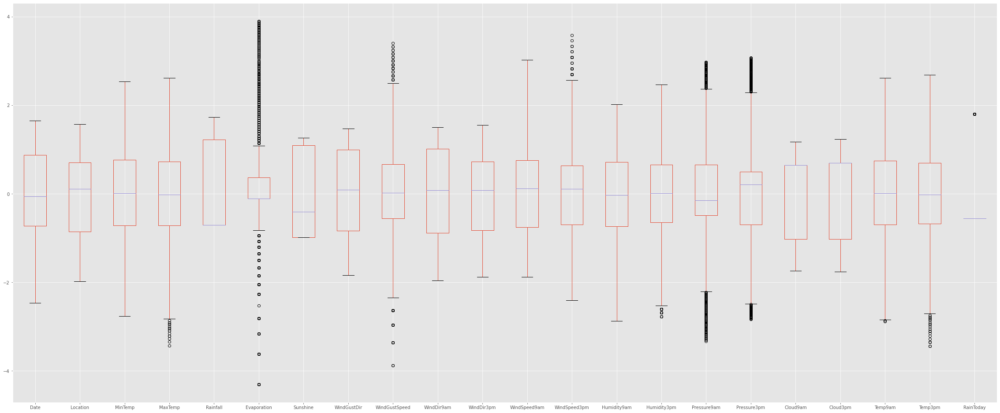

In [39]:
x.iloc[:,0:22].boxplot(figsize=[40,20])
plt.subplots_adjust(bottom=0.25)
plt.show()

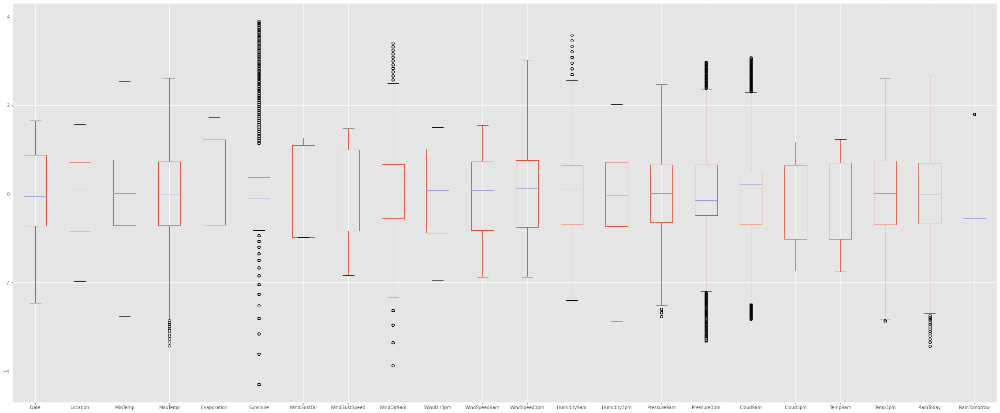

In [40]:
x1.iloc[:,0:22].boxplot(figsize=[40,20])
plt.subplots_adjust(bottom=0.25)
plt.show()

In [41]:
z=np.abs(zscore(df))
threshold=3
np.where(z>3)

(array([  44,   52,   52,   61,   62,   62,   67,   68,   68,  123,  267,
         296,  356,  381,  381,  431,  462,  544,  563,  568,  569,  642,
         648,  683,  683,  684,  699,  713,  738,  770,  795,  796,  797,
         802,  803,  907,  928,  935,  949,  951,  979,  980,  980,  980,
        1008, 1009, 1011, 1138, 1148, 1149, 1151, 1187, 1189, 1202, 1203,
        1237, 1241, 1264, 1265, 1275, 1357, 1358, 1411, 1412, 1413, 1479,
        1480, 1481, 1487, 1501, 1513, 1514, 1535, 1587, 1644, 1661, 1665,
        1673, 1680, 1692, 1774, 1782, 1783, 1811, 1819, 1829, 1841, 1873,
        1881, 1898, 1903, 1945, 1952, 1954, 2016, 2028, 2033, 2043, 2063,
        2074, 2083, 2108, 2116, 2182, 2183, 2186, 2201, 2211, 2219, 2219,
        2230, 2231, 2265, 2429, 2488, 2500, 2505, 2510, 2527, 2527, 2541,
        2576, 2577, 2593, 2659, 2676, 2677, 2678, 2735, 2802, 2827, 2827,
        2835, 2841, 2849, 2849, 2855, 2863, 2869, 2877, 2883, 2885, 2886,
        2890, 2891, 2897, 2898, 2899, 

In [42]:
df_new_z=df[(z<3).all(axis=1)]
df_new_z

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month,Year,Day
0,0,1,149,134,5,21,0,13,20,13,...,103,8,7,145,134,0,0,11,0,0
1,1,1,89,156,0,21,0,14,20,6,...,110,7,7,148,159,0,0,11,0,1
2,2,1,144,162,0,21,0,15,21,13,...,119,7,2,186,148,0,0,11,0,2
3,3,1,107,185,0,21,0,4,9,9,...,160,7,7,157,181,0,0,11,0,3
4,4,1,190,228,8,21,0,13,18,1,...,92,7,8,154,213,0,0,11,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2999,9,43,139,0,21,0,0,13,9,...,235,7,7,77,140,0,0,5,9,20
8421,3000,9,51,158,0,21,0,6,8,9,...,223,7,7,85,161,0,0,5,9,21
8422,3001,9,69,174,0,21,0,3,16,9,...,200,7,7,101,177,0,0,5,9,22
8423,3002,9,93,175,0,21,0,9,11,10,...,197,3,2,127,176,0,0,5,9,23


In [43]:
df_new_z.shape

(7803, 26)

In [44]:
data_loss = (8425-7803)/8425*100
data_loss

7.382789317507418

In [48]:
y.value_counts()

0    6434
1    1991
Name: RainTomorrow, dtype: int64

In [49]:
from imblearn.over_sampling import SMOTE

SM = SMOTE()
x, y = SM.fit_resample(x,y)

In [50]:
y.value_counts()

0    6434
1    6434
Name: RainTomorrow, dtype: int64

In [51]:
df_new_z.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month,Year,Day
0,0,1,149,134,5,21,0,13,20,13,...,103,8,7,145,134,0,0,11,0,0
1,1,1,89,156,0,21,0,14,20,6,...,110,7,7,148,159,0,0,11,0,1
2,2,1,144,162,0,21,0,15,21,13,...,119,7,2,186,148,0,0,11,0,2
3,3,1,107,185,0,21,0,4,9,9,...,160,7,7,157,181,0,0,11,0,3
4,4,1,190,228,8,21,0,13,18,1,...,92,7,8,154,213,0,0,11,0,4


In [52]:
maxAccu=0
maxRS=0
for i in range(0,21):
    x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=.20, random_state =i)
    LR = LogisticRegression()
    LR.fit(x_train, y_train)
    predrf = LR.predict(x_test)
    acc=accuracy_score(y_test, predrf)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is",maxAccu,"on Random_state",maxRS)

Best accuracy is 0.7727272727272727 on Random_state 12


In [53]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size = .20, random_state = 12)

In [54]:
R = LogisticRegression()
LR.fit(x_train, y_train)
predlr = LR.predict(x_test)
print("Accuracy",accuracy_score(y_test, predlr)*100)
print(confusion_matrix(y_test,predlr))
print(classification_report(y_test,predlr))

Accuracy 77.27272727272727
[[1001  265]
 [ 320  988]]
              precision    recall  f1-score   support

           0       0.76      0.79      0.77      1266
           1       0.79      0.76      0.77      1308

    accuracy                           0.77      2574
   macro avg       0.77      0.77      0.77      2574
weighted avg       0.77      0.77      0.77      2574



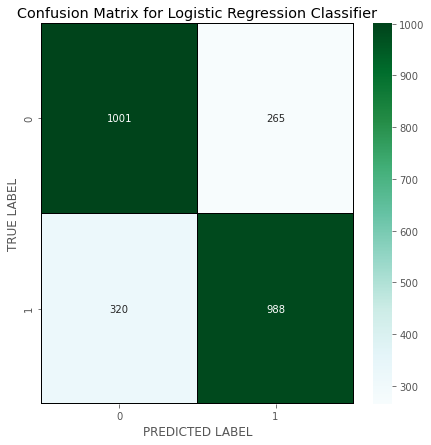

In [55]:
cm = confusion_matrix(y_test,predlr)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Logistic Regression Classifier')
plt.show()

In [56]:
dt = DecisionTreeClassifier()
dt.fit(x_train, y_train)
preddt = dt.predict(x_test)
print("Accuracy",accuracy_score(y_test, preddt)*100)
print(confusion_matrix(y_test,preddt))
print(classification_report(y_test,preddt))

Accuracy 87.95648795648796
[[1103  163]
 [ 147 1161]]
              precision    recall  f1-score   support

           0       0.88      0.87      0.88      1266
           1       0.88      0.89      0.88      1308

    accuracy                           0.88      2574
   macro avg       0.88      0.88      0.88      2574
weighted avg       0.88      0.88      0.88      2574



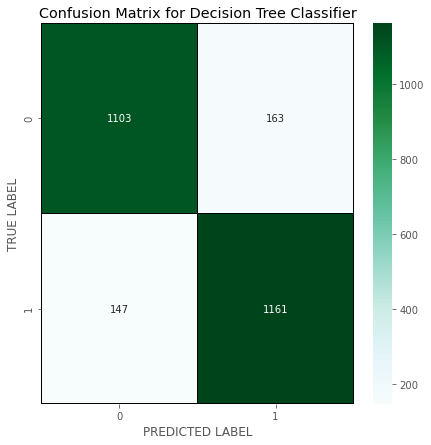

In [57]:
cm = confusion_matrix(y_test,preddt)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Decision Tree Classifier')
plt.show()

In [58]:
rf = RandomForestClassifier()
rf.fit(x_train, y_train)
predrf = rf.predict(x_test)
print("Accuracy",accuracy_score(y_test, predrf)*100)
print(confusion_matrix(y_test,predrf))
print(classification_report(y_test,predrf))

Accuracy 93.97824397824398
[[1182   84]
 [  71 1237]]
              precision    recall  f1-score   support

           0       0.94      0.93      0.94      1266
           1       0.94      0.95      0.94      1308

    accuracy                           0.94      2574
   macro avg       0.94      0.94      0.94      2574
weighted avg       0.94      0.94      0.94      2574



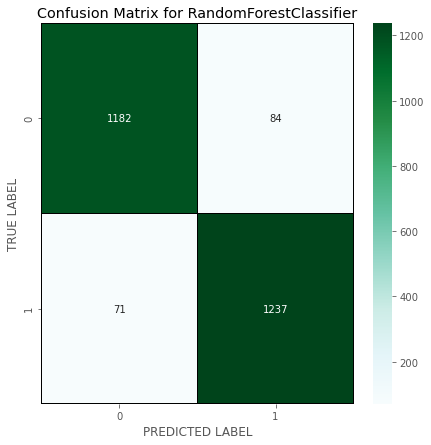

In [59]:
cm = confusion_matrix(y_test,predrf)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for RandomForestClassifier')
plt.show()

In [60]:
svc = SVC()
svc.fit(x_train,y_train)

ad_pred = svc.predict(x_test)
print("Accuracy",accuracy_score(y_test, ad_pred)*100)
print(confusion_matrix(y_test,ad_pred))
print(classification_report(y_test,ad_pred))

Accuracy 86.36363636363636
[[1063  203]
 [ 148 1160]]
              precision    recall  f1-score   support

           0       0.88      0.84      0.86      1266
           1       0.85      0.89      0.87      1308

    accuracy                           0.86      2574
   macro avg       0.86      0.86      0.86      2574
weighted avg       0.86      0.86      0.86      2574



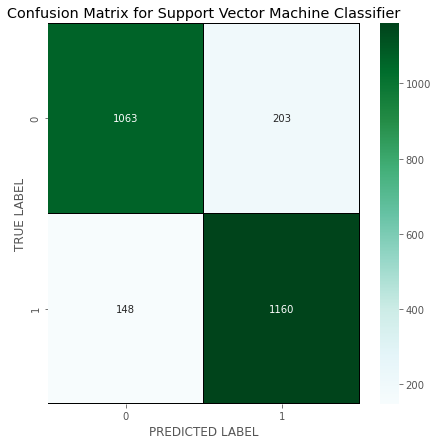

In [61]:
cm = confusion_matrix(y_test,ad_pred)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Support Vector Machine Classifier')
plt.show()

In [62]:
scr=cross_val_score(LR, x, y, cv=5)
print("cross validation score of Logistic Regression model :",scr.mean())

cross validation score of Logistic Regression model : 0.678128922940427


In [63]:
scr=cross_val_score(rf, x, y, cv=5)
print("cross validation score of Random Forest model :",scr.mean())

cross validation score of Random Forest model : 0.7509445255267253


In [66]:
scr=cross_val_score(svc, x, y, cv=5)
print("cross validation score of SVC model :",scr.mean())

cross validation score of SVC model : 0.6823978672793285


In [67]:
parameters = {'max_features': ['auto', 'sqrt', 'log2'],
             'max_depth' : [4,5,6,7,8],
             'criterion' :['gini' , 'entropy']}

In [71]:
GCV=GridSearchCV(RandomForestClassifier(),parameters,cv=5,scoring="accuracy")
GCV.fit(x_train,y_train)
GCV.best_params_

{'criterion': 'gini', 'max_depth': 8, 'max_features': 'sqrt'}

In [72]:
Final_mod=DecisionTreeClassifier(criterion='entropy',max_depth=39, max_features='log2')
Final_mod.fit(x_train,y_train)
pred=Final_mod.predict(x_test)
acc=accuracy_score(y_test, pred)

print(acc*100)

88.53923853923854


In [73]:
GCV_pred=GCV.best_estimator_.predict(x_test)
accuracy_score(y_test,GCV_pred)

0.8558663558663558

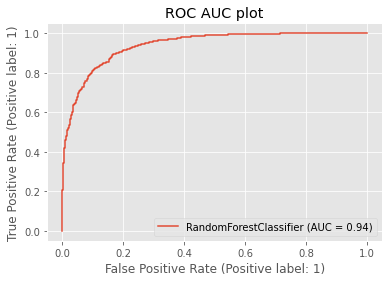

In [74]:
plot_roc_curve(GCV.best_estimator_,x_test,y_test)
plt.title("ROC AUC plot")
plt.show()

In [ ]:
import joblib 
joblib.dump(GCV.best_estimator_,"Coustmerchurn_prediction.pkl")